# Прекод

# Сборный проект-5

### Описание проекта

Вы работаете в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”). 

Ваши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. 

Ваш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. 

### Цель проекта

Разработать демонстрационную версию поиска изображений по запросу. 

Нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле **`train_dataset.csv`** находится информация, необходимая для обучения: 
* `'image'` - имя файла изображения;
* `'query_id'` - идентификатор описания;
* `'query_text'` - текст описания. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке **`train_images`** содержатся изображения для тренировки модели.

В файле **`CrowdAnnotations.tsv`** — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле **`ExpertAnnotations.tsv`** содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 - оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле **`test_queries.csv`** находится информация, необходимая для тестирования: 
* `'query_id'` - идентификатор запроса;
* `'query_text'` - текст запроса;
* `'image'` - релевантное изображение. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке **`test_images`** содержатся изображения для тестирования модели.

## Импорт необходимых библиотек

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import re
import torch
import spacy
import os
import random
import copy
from PIL import Image
from tqdm import notebook

from sklearn.model_selection import GridSearchCV, GroupShuffleSplit, GroupKFold
from sklearn.preprocessing import Normalizer
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.metrics import mean_squared_error

import torch.nn as nn
import torchvision.models as models
from torchvision import transforms

from transformers import AutoTokenizer, AutoModel, CLIPProcessor, CLIPModel

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
torch.set_num_threads(8)

In [2]:
RANDOM_STATE = 42
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

DATA_PATH = '/Users/mashik/Desktop/projects_yandex_practicum/Project_17/to_upload'
TRAIN_IMAGES_PATH = os.path.join(DATA_PATH, 'train_images')
TEST_IMAGES_PATH = os.path.join(DATA_PATH, 'test_images')

## 1. Загрузка данных

In [3]:
def info_df(df):
    '''
    Выводит основную информацию о датафрейме
    '''
    display(df.head(10))
    print('*'*50, '\n')
    df.info()
    print('*'*50, '\n')
    print('Количество пропущенных значений:\n', df.isna().sum(), '\n')
    print('*'*50, '\n')
    print('Количество явных дубликатов:', df.duplicated().sum())
    print('*'*50, '\n')
    display(df.describe().T)

### 1.1. Датасет с данными для обучения

In [4]:
df_train = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))

In [5]:
info_df(df_train)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


************************************************** 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
************************************************** 

Количество пропущенных значений:
 image         0
query_id      0
query_text    0
dtype: int64 

************************************************** 

Количество явных дубликатов: 0
************************************************** 



,count,unique,top,freq
image,5822,1000,3364151356_eecd07a23e.jpg,10
query_id,5822,977,2600867924_cd502fc911.jpg#2,34
query_text,5822,977,"Two dogs , one brown and white and one black and white , run on a field .",34


* Датасет содержит 5822 строки и 3 столбца.
* Данные соответствуют описанию.
* Пропущенных значений нет.
* Явных дубликатов нет.
* Количество уникальных изображений - 1000.
* Количество текстовых описаний - 977.

### 1.2. Датасет с изображениями для обучения

In [6]:
# Получаем список всех файлов в папке
train_image_names = [f for f in os.listdir(TRAIN_IMAGES_PATH) if os.path.isfile(os.path.join(TRAIN_IMAGES_PATH, f)) and f.endswith('.jpg')]
print('Количество изображений в папке:', len(train_image_names))

Количество изображений в папке: 1000


Количество изображений для обучения в папке и уникальное количество изображений в таблице с текстовыми описаниями совпадает.

Посмотрим несколько из них.

In [7]:
def show_images(path, images, images_cnt=8, title=False, figsize=(16,16)):
    '''
    Выводит изображения
    '''
    fig = plt.figure(figsize=figsize)
    for i in range(images_cnt):
        fig.add_subplot(math.ceil(images_cnt/4), 4, i+1)
        image = Image.open(os.path.join(path, images[i]))
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        if title:
            plt.title(images[i], fontsize=8)
    plt.show()

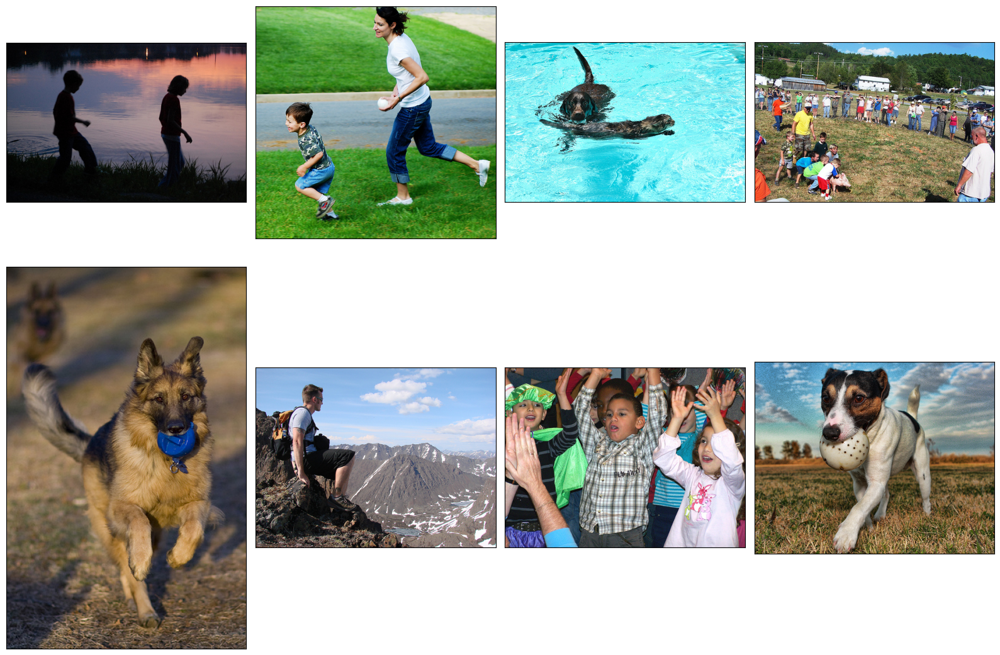

In [8]:
train_random_images = random.sample(train_image_names, 8)
show_images(TRAIN_IMAGES_PATH, train_random_images)

Видно, что есть фотографии разных размеров. Нужно будет в дальнейшем привести их к одинаковому размеру.

Также есть фотографии с детьми, которые нужно будет удалить.

### 1.3. Датасет с краудсорсинговыми оценками

In [9]:
df_crowd = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), 
                       sep='\t', 
                       names=['image', 'query_id', 'match_rate', 'matches_count', 'mismatches_count'])
info_df(df_crowd)

,image,query_id,match_rate,matches_count,mismatches_count
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


************************************************** 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             47830 non-null  object 
 1   query_id          47830 non-null  object 
 2   match_rate        47830 non-null  float64
 3   matches_count     47830 non-null  int64  
 4   mismatches_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
************************************************** 

Количество пропущенных значений:
 image               0
query_id            0
match_rate          0
matches_count       0
mismatches_count    0
dtype: int64 

************************************************** 

Количество явных дубликатов: 0
************************************************** 



,count,mean,std,min,25%,50%,75%,max
match_rate,47830.0,0.068786,0.207532,0.0,0.0,0.0,0.0,1.0
matches_count,47830.0,0.208488,0.628898,0.0,0.0,0.0,0.0,5.0
mismatches_count,47830.0,2.820155,0.656676,0.0,3.0,3.0,3.0,6.0


* Датасет содержит 47830 строк и 5 столбцов с краудсорсинговыми оценками к каждой паре "изображение-описание".
* Данные соответствуют описанию.
* Пропущенных значений нет.
* Явных дубликатов нет.
* Значения количественных данных лежат в пределах допустимых значений.

### 1.4. Датасет с экспертными оценками

In [10]:
df_expert= pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), 
                       sep='\t', 
                       names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
info_df(df_expert)

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


************************************************** 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
************************************************** 

Количество пропущенных значений:
 image       0
query_id    0
expert_1    0
expert_2    0
expert_3    0
dtype: int64 

************************************************** 

Количество явных дубликатов: 0
************************************************** 



,count,mean,std,min,25%,50%,75%,max
expert_1,5822.0,1.436620,0.787084,1.0,1.0,1.0,2.0,4.0
expert_2,5822.0,1.624356,0.856222,1.0,1.0,1.0,2.0,4.0
expert_3,5822.0,1.881999,0.904087,1.0,1.0,2.0,2.0,4.0


* Датасет содержит 5822 строки и 5 столбцов с экспертными оценками к каждой паре "изображение-описание" (по шкале от 1 до 4).
* Данные соответствуют описанию.
* Пропущенных значений нет.
* Явных дубликатов нет.
* Значения количественных данных лежат в пределах допустимых значений.

### 1.5. Датасет с тестовыми данными

In [11]:
df_test = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'),sep='|', index_col=0)
info_df(df_test)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adult supervision .,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a playground .,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera at a park .,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .,1232148178_4f45cc3284.jpg


************************************************** 

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
************************************************** 

Количество пропущенных значений:
 query_id      0
query_text    0
image         0
dtype: int64 

************************************************** 

Количество явных дубликатов: 0
************************************************** 



,count,unique,top,freq
query_id,500,500,1177994172_10d143cb8d.jpg#0,1
query_text,500,500,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1
image,500,100,1177994172_10d143cb8d.jpg,5


* Датасет содержит 500 строк и 3 столбца.
* Данные соответствуют описанию.
* Пропущенных значений нет.
* Явных дубликатов нет.
* Количество уникальных изображений - 100.
* Количество текстовых описаний - 500.

### 1.6. Датасет с тестовыми изображениями

In [12]:
# Получаем список всех файлов в папке
test_image_names = [f for f in os.listdir(TEST_IMAGES_PATH) if os.path.isfile(os.path.join(TEST_IMAGES_PATH, f)) and f.endswith('.jpg')]
print('Количество изображений в папке:', len(test_image_names))

Количество изображений в папке: 100


Количество тестовых изображений в папке и уникальное количество изображений в таблице с текстовыми описаниями совпадает.

Посмотрим несколько из них.

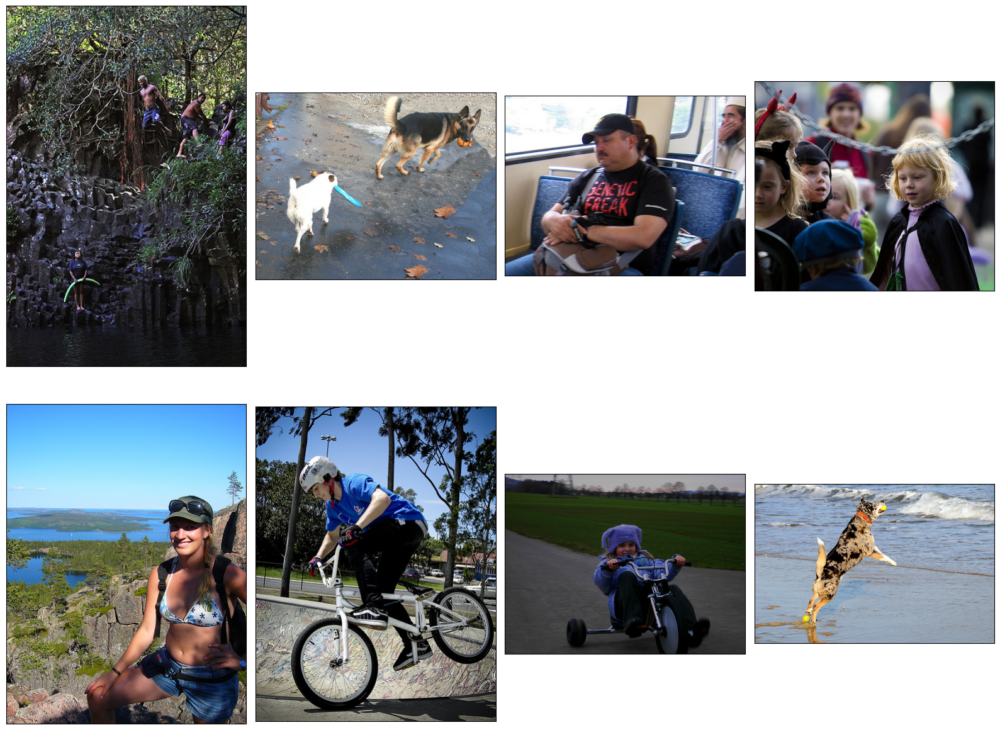

In [13]:
test_random_images = random.sample(test_image_names, 8)
show_images(TEST_IMAGES_PATH, test_random_images)

### Вывод:

Мы загрузили и ознакомились с данными:
* Все данные соответствуют описанию.
* Обучающий датасет содержит 5822 строки и 3 столбца, 1000 уникальных наименований изображений и 977 уникальных текстовых описаний.
* Папка с изображениями для обучения содержит 1000 фотографий. Фотографии разных размеров. Также есть фотографии с детьми, которые нужно будет удалить.
* Тестовый датасет содержит 500 строк и 3 столбца, 100 уникальных наименований изображений и 500 уникальных текстовых описаний.
* Папка с тестовыми изображениями содержит 100 фотографий.
* Датасет с краудсорсинговыми оценками содержит 47830 строк и 5 столбцов с оценками для каждой пары "изображение-описание".
* Датасет с экспертными оценками содержит 5822 строки и 5 столбцов с оценками трех экспертов для каждой пары "изображение-описание" (по шкале от 1 до 4).
* Пропусков и явных дубликатов не выявлено.

## 2. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


___

### 2.1. Оценки экспертов

Посмотрим, как распределены оценки экспертов.

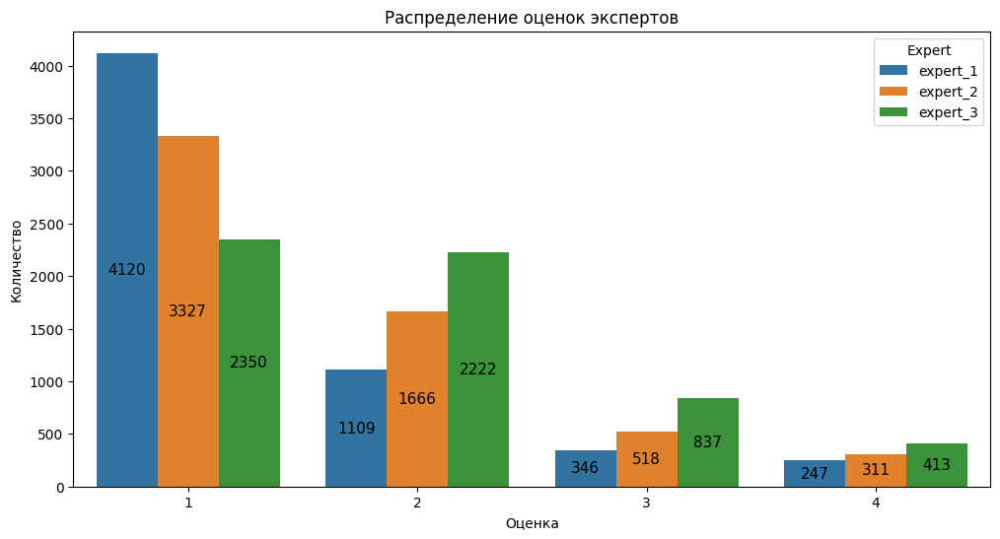

In [14]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.countplot(df_expert.melt(id_vars=['image', 'query_id'], 
                             value_vars=['expert_1', 'expert_2', 'expert_3'], 
                             var_name='Expert', 
                             value_name='Score'), x='Score', hue='Expert')
plt.title("Распределение оценок экспертов")
plt.xlabel("Оценка")
plt.ylabel("Количество")

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    if height > 0:
        x, y = p.get_xy() 
        ax.text(x+width/2, 
                y+height/2, 
                int(height), 
                horizontalalignment='center', 
                verticalalignment='center',
                fontsize=11)

plt.show()

* Оценки распределены по шкале от 1 до 4, что позволит модели обучаться не только на простых примерах "соответствует/не соответствует", но и улавливать нюансы схожести.
* Чаще всего эксперты ставят оценку 1 (изображение и запрос совершенно не соответствуют друг другу).
* Самый строгий эксперт - expert_1 (больше всего баллов о несоотвествии изображения и текста), expert_3, наоборот, чаще других ставит более высокие баллы, expert_2 дает усредненную оценку.

Для агрегации оценок экспертов воспользуемся голосованием большинства. В случаях, когда каждый эксперт поставил разные оценки, исключим пару изображение-текст. Также переведем оценки в шкалу от 0 до 1.

In [15]:
def agg_expert_score(row):
    '''
    Функция агрегирует оценки экспертов и переводит результат в диапазон [0, 1].
    Итоговая оценка определяется голосованием большинства.
    Если все оценки разные, ставится None для последующего удаления строки.
    '''
    scores = [row['expert_1'], row['expert_2'], row['expert_3']]
    if len(set(scores)) == 3:
        row['agg_expert_score'] = None
    else:
        row['agg_expert_score'] = (max(set(scores), key=scores.count) - 1) / 3
    return row

In [16]:
df_expert = df_expert.apply(agg_expert_score, axis=1)
display(df_expert.head())
df_expert.info()

,image,query_id,expert_1,expert_2,expert_3,agg_expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             5822 non-null   object 
 1   query_id          5822 non-null   object 
 2   expert_1          5822 non-null   int64  
 3   expert_2          5822 non-null   int64  
 4   expert_3          5822 non-null   int64  
 5   agg_expert_score  5696 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 273.0+ KB


In [17]:
print(f'Количество строк без агрегированной экспертной оценки: {df_expert['agg_expert_score'].isna().sum()} \
({df_expert['agg_expert_score'].isna().mean() * 100:.2f}%)')
print(f'\nРаспределение значений агрегированной экспертной оценки:\n {df_expert['agg_expert_score'].value_counts()}')

Количество строк без агрегированной экспертной оценки: 126 (2.16%)

Распределение значений агрегированной экспертной оценки:
 agg_expert_score
0.000000    3327
0.333333    1566
0.666667     492
1.000000     311
Name: count, dtype: int64


Видно, что агрегированная оценка схожа по значениям с оценками второго эксперта. Чтобы сохранить больше данных для обучения, можно использовать оценки expert_2, нормализовав их (переведя в диапазон [0, 1]).

In [18]:
df_expert['expert_score'] = (df_expert['expert_2'] - 1) / 3
display(df_expert.head())
df_expert.info()
print(f'\nРаспределение значений агрегированной экспертной оценки:\n {df_expert['expert_score'].value_counts()}')

,image,query_id,expert_1,expert_2,expert_3,agg_expert_score,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             5822 non-null   object 
 1   query_id          5822 non-null   object 
 2   expert_1          5822 non-null   int64  
 3   expert_2          5822 non-null   int64  
 4   expert_3          5822 non-null   int64  
 5   agg_expert_score  5696 non-null   float64
 6   expert_score      5822 non-null   float64
dtypes: float64(2), int64(3), object(2)
memory usage: 318.5+ KB

Распределение значений агрегированной экспертной оценки:
 expert_score
0.000000    3327
0.333333    1666
0.666667     518
1.000000     311
Name: count, dtype: int64


Количество пар изображение-описание в датасете с текстовыми описаниями `df_train` и в датасетете с экспертными оценками `df_expert` одинаковое (5822). Проверим, все ли пары пересекаются в обоих датасетах.

In [19]:
print('Количество общих пар:', \
len(set(df_train['image'] + '_' + df_train['query_id']).intersection(set(df_expert['image'] + '_' + df_expert['query_id']))))

Количество общих пар: 5822


Экспертные оценки есть по всем парам, входящим в обучающий датасет с текстовыми описаниями.

### 2.2. Краудсорсинговые оценки

Теперь посмотрим на краудсорсинговые оценки.

Посмотрим, как распределены значения доли людей, подтвердивших соостветствие описания изображению, и как много спорных случаев, когда среди голосов людей нет однозначной оценки.

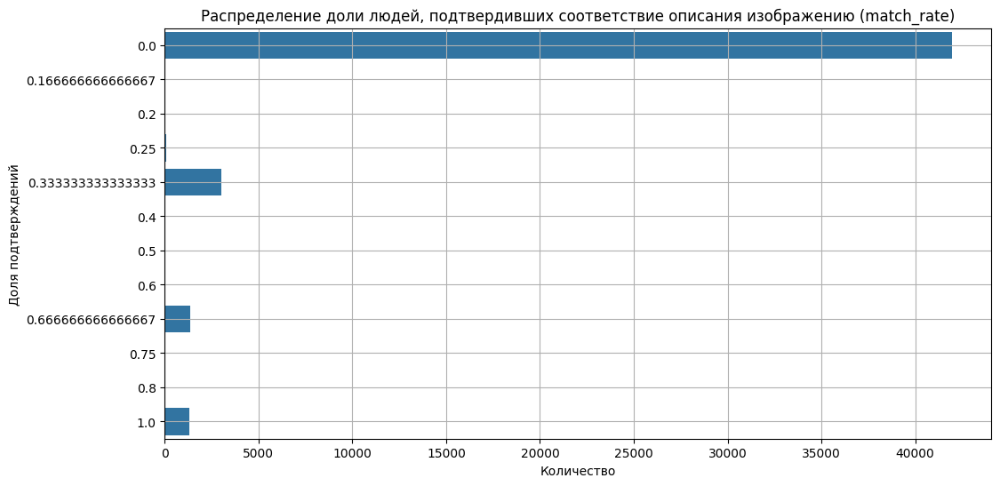

match_rate
0.000000    41970
0.333333     3000
0.666667     1360
1.000000     1323
0.250000       96
0.500000       27
0.200000       22
0.750000        9
0.600000        8
0.400000        8
0.800000        4
0.166667        3
Name: count, dtype: int64

Количество спорных пар: 4537 (9.49%)


In [20]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.countplot(df_crowd, y='match_rate')
plt.title('Распределение доли людей, подтвердивших соответствие описания изображению (match_rate)')
plt.ylabel('Доля подтверждений')
plt.xlabel('Количество')
plt.grid(True)
plt.show()

print(df_crowd['match_rate'].value_counts())
print(f'\nКоличество спорных пар: {len(df_crowd[(df_crowd['match_rate'] > 0) & (df_crowd['match_rate'] < 1)])} \
({len(df_crowd[(df_crowd['match_rate'] > 0) & (df_crowd['match_rate'] < 1)]) / len(df_crowd) * 100:.2f}%)')

Видно, что больше всего значений 0 и 1, где люди могут однозначно сказать, соответствует ли описание изображению, но также есть около 4,5 тысяч спорных случаев (примерно 9.5%). Подавляющее большинство оценок - 0 (не соответствие описания изображению).

Посмотрим, как распределено количество голосов на одну пару изображение-описание.

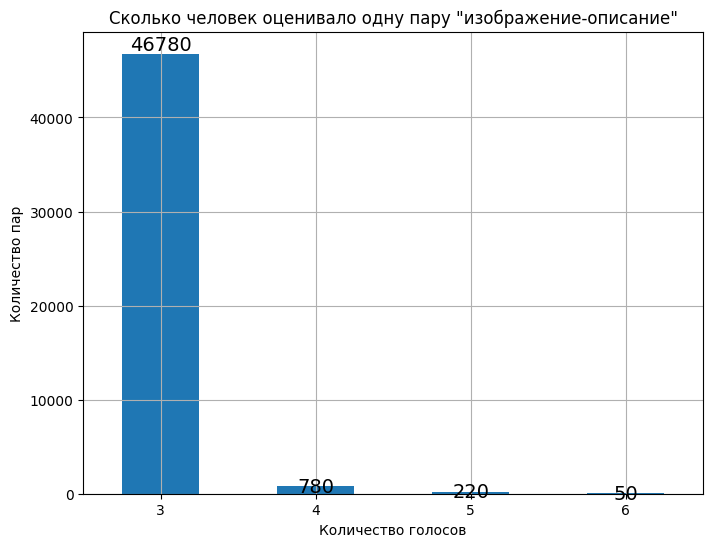

3    46780
4      780
5      220
6       50
Name: count, dtype: int64

In [21]:
from scipy.spatial.transform import rotation


ax = (df_crowd['matches_count'] + df_crowd['mismatches_count']).value_counts().plot(kind='bar', figsize=(8, 6), grid=True)
plt.title('Сколько человек оценивало одну пару "изображение-описание"')
plt.xlabel('Количество голосов')
plt.ylabel('Количество пар')
plt.xticks(rotation=0)

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    if height > 0:
        x, y = p.get_xy() 
        ax.text(x+width/2, 
                y+height*1.02, 
                int(height), 
                horizontalalignment='center', 
                verticalalignment='center',
                fontsize=14)

plt.show()

(df_crowd['matches_count'] + df_crowd['mismatches_count']).value_counts()

В большинстве случаев соответствие описания изображению оценивали 3 человека.

Теперь проверим, сколько пар "изображение-описание" пересекается с обучающим датасетом с текстовыми описаниями `df_train`.

In [22]:
common_pairs = len(set(df_train['image'] + '_' + df_train['query_id']).intersection(set(df_crowd['image'] + '_' + df_crowd['query_id'])))
print(f'Количество общих пар: {common_pairs} ({common_pairs / len(df_train) * 100:.2f}%)')

Количество общих пар: 2329 (40.00%)


Несмотря на гораздо большее количество данных в датасете с краудсорсинговыми оценками (47830 записей), пересечений с `df_train` меньше половины. 

### 2.3. Объединение датасетов

Проанализировав экспертные и краудсорсинговые оценки, наиболее подходящим будет использование для обучения моделей только экспертных оценок:
* экспертные оценки получены квалифицированными специалистами и скорее всего являются максимально чистыми и достоверными;
* в экспертных оценках есть более точная градация, когда описание не полностью соответствует изображению (0.33, 0.67 по шкале [0, 1]), что повышает качество данных;
* экспертные оценки представлены для всех записей обучающей `df_train`, в то время как краудсорсинговые покрывают только 40% обучающих данных.

Объединим обучающий датасет `df_train` c экспертными оценками `df_expert`.

In [23]:
df_train = pd.merge(df_train, df_expert[['image', 'query_id', 'expert_score']],
                      how='outer', on=['image', 'query_id'])
display(df_train.head())
df_train.info()

,image,query_id,query_text,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses smiles .,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empty square .,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5822 non-null   object 
 1   query_id      5822 non-null   object 
 2   query_text    5822 non-null   object 
 3   expert_score  5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


### Вывод:

В ходе исследовательского анализа данных мы изучили два датасета с экспертными и краудсорсинговыми оценками соответствия текстового описания и изображения.

* **Анализ экспертных оценок**:
    * Исходные данные были распределены по шкале от 1 до 4.
    * В качестве агрегированной оценки мы выбрали оценки второго эксперта expert_2, потому что они максимально близки к оценкам, полученным голосованием большинства, но при этом не теряется часть данных, где мнения экспертов разошлись.
    * Итоговая оценка expert_score переведена в диапазон [0, 1].
    * Экспертная оценка распределена между четырьмя значениями, что позволит модели обучаться не только на простых примерах "соответствует/не соответствует", но и улавливать нюансы схожести.
    * Экспертные оценки есть по всем парам, входящим в обучающий датасет с текстовыми описаниями.
* **Анализ краудсорсинговых оценок**:
    * Больше всего значений 0 и 1, где люди могут однозначно сказать, соответствует ли описание изображению, но также есть около 4,5 тысяч спорных случаев (примерно 9.5%).
    * Данные несбалансированы (имеется сильный перекос в сторону значения 0 (не соответствие описания изображению)).
    * В большинстве случаев оценки выставлялись 3мя людьми, но также есть около 1000 записей, где соответствие оценивалось количеством людей от 4 до 6.
    * Несмотря на гораздо большее количество данных в датасете с краудсорсинговыми оценками (47830 записей), пересечений с `df_train` всего 40%. 

Для обучения моделей **будут использованы только экспертные оценки**:
* экспертные оценки получены квалифицированными специалистами и скорее всего являются максимально чистыми и достоверными;
* они более информативны, так как покрывают случаи, когда описание не полностью соответствует изображению;
* они полностью соответствуют обучающему датасету `df_train`.

## 3. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

___

Сначала подготовим текст. Напишем функцию, которая очищает текст, токенизирует и лемматизирует его. Будем использовать библиотеку SpaCy.

In [24]:
def preprocess_text(text):
    """
    Функция токенизирует, очищает и лемматизирует текст
    """
    tokens = nlp(text)
    text = ' '.join([word.lemma_ for word in tokens])
    text = ' '.join(re.sub(r'[^a-zA-Z]', ' ', text.lower()).split())
    return text

In [25]:
%%time
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

df_train['lemm_query_text'] = df_train['query_text'].apply(preprocess_text)

df_train[['query_text', 'lemm_query_text']].head()

CPU times: user 10.1 s, sys: 212 ms, total: 10.3 s
Wall time: 10.7 s


,query_text,lemm_query_text
0,A young child is wearing blue goggles and sitting in a float in a pool .,a young child be wear blue goggle and sit in a float in a pool
1,A girl wearing a yellow shirt and sunglasses smiles .,a girl wear a yellow shirt and sunglasse smile
2,A man sleeps under a blanket on a city street .,a man sleep under a blanket on a city street
3,A woman plays with long red ribbons in an empty square .,a woman play with long red ribbon in an empty square
4,Chinese market street in the winter time .,chinese market street in the winter time


Теперь создадим список слов, по которым будет фильтроваться запрещенный контент.

In [26]:
ban_keywords = [
    'child',
    'kid',
    'baby',
    'boy',
    'girl',
    'toddler',
    'teen',
    'teenager',
    'infant',
    'newborn',
    'schoolboy',
    'schoolgirl',
    'schoolchild',
    'schoolkid', 
    'preschooler', 
    'adolescent', 
    'youth'
]

Теперь удалим изображения, описания которых содержат "запрещенные" слова. Так как изображение может иметь несколько описаний, не каждое из которых может содержать слова для фильтрации, будем использовать значения из столбца `'query_id'`, которые содержат имя изображения (за минусом двух последних символов), к которому они относятся.

In [27]:
def get_images_to_remove(df, text_column, ban_keywords):
    """
    Ищет изображения, связанные с описаниями, содержащими запрещенные слова.
    Возвращает имена изображений для удаления.
    """
    # создаем шаблон для поиска любого слова из списка запрещенных слов, обозначив границы слова
    pattern = r'\b(' + '|'.join(ban_keywords) + r')\b'
    # ищем совпадения
    mask = df[text_column].str.contains(pattern, regex=True)
    banned_queries = df.loc[mask, 'query_id']
    images_to_remove = set(banned_queries.str[:-2])
    
    return banned_queries, images_to_remove

In [28]:
banned_queries, images_to_remove = get_images_to_remove(df_train, 'lemm_query_text', ban_keywords)

print(f"Количество уникальных изображений для удаления: {len(images_to_remove)}")

Количество уникальных изображений для удаления: 292


Проверим, какие текстовые описания и изображения попали в "запрещенные".

In [29]:
df_train[df_train['query_id'].isin(banned_queries)]['query_text'].sample(10)

4212       Two girls are sitting on a path by a river with their bicycles parked beside them .
2900                                                   A blonde girl surfing down a sandy hill
4425                                A young girl is wearing a purple shirt and pink headband .
1895                       A smiling child sits against a wall on a blanket and eats a snack .
1831                                             A young girl with makeup and jewelry smiles .
5644    Laying on stones , a girl with messy hair has her head on the boy laying next to her .
1861                       A young , long-haired , girl on the beach , is jumping in the air .
1070                               A little boy in a striped shirt is standing behind a tree .
1763                    Two boys have made a goal out of two jackets in order to play soccer .
213                                               A young girl standing in front of a fountain
Name: query_text, dtype: object

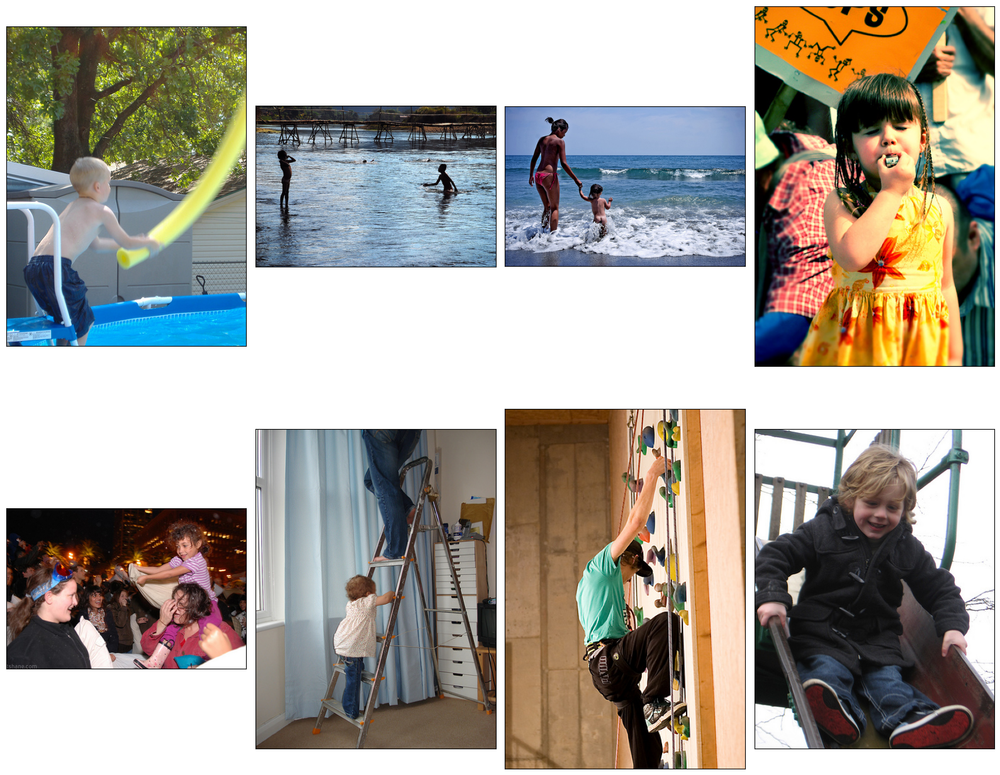

In [30]:
random_banned_images = random.sample(list(images_to_remove), 8)
show_images(TRAIN_IMAGES_PATH, random_banned_images)

В отфильтрованные изображения действительно попали фото детей и подростков.

Удалим из обучающего датасета строки с отфильтрованными изображениями.

In [31]:
df_train_filtered = df_train[~df_train['image'].isin(images_to_remove)].reset_index(drop=True)

print(f'Размер обучающего датасета до удаления записей: {df_train.shape}')
print(f'Размер обучающего датасета после удаления записей: {df_train_filtered.shape}')
print(f'Количество удаленных записей: {len(df_train) - len(df_train_filtered)} \
({(len(df_train) - len(df_train_filtered)) / len(df_train) * 100:.2f}%)')

Размер обучающего датасета до удаления записей: (5822, 5)
Размер обучающего датасета после удаления записей: (4076, 5)
Количество удаленных записей: 1746 (29.99%)


Посмотрим на оставшиеся изображения.

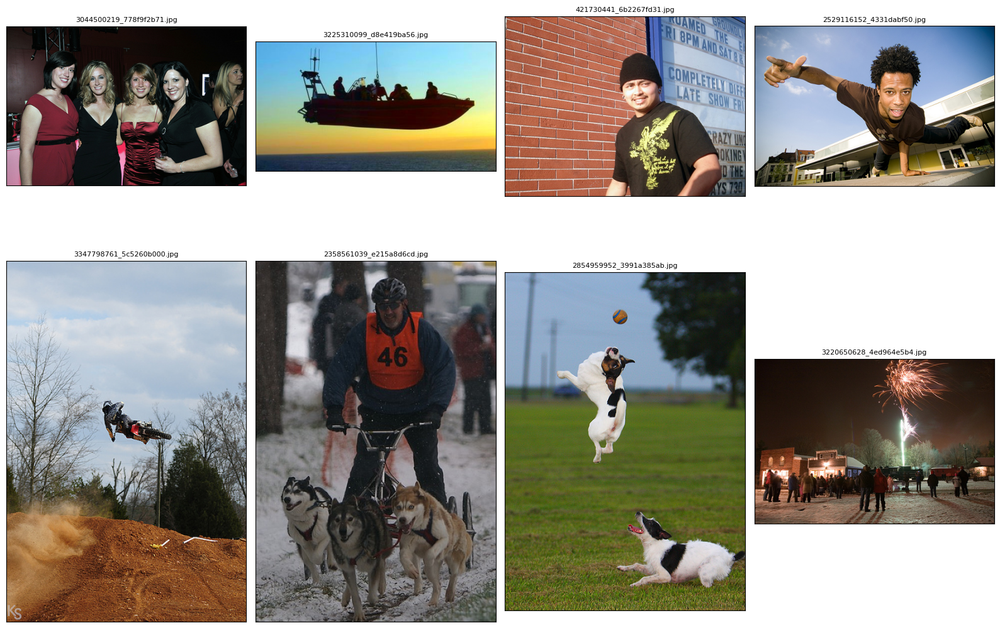

In [32]:
filtered_images = list(df_train_filtered['image'].sample(8))
show_images(TRAIN_IMAGES_PATH, filtered_images, title=True)

В случайной выборке отфильтрованных изображений было замечено несколько фотографий с детьми. Возможно, для таких фотографий не было "собственного" описания. 

Проверим на примере попавшегося в отфильтрованных изображении с ребенком.

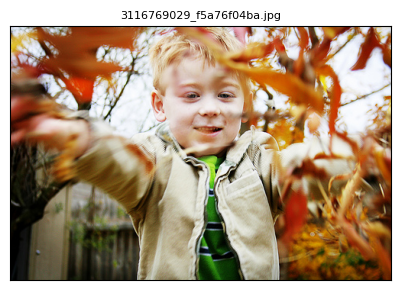

In [33]:
child_image = ["3116769029_f5a76f04ba.jpg"]
show_images(TRAIN_IMAGES_PATH, child_image, images_cnt=1, title=True)

In [34]:
df_train_filtered.query('image == "3116769029_f5a76f04ba.jpg"')

,image,query_id,query_text,expert_score,lemm_query_text
2050,3116769029_f5a76f04ba.jpg,2208310655_a3d83080c5.jpg#2,"An adult with two kids , one child making a face and the other kissing the adult 's cheek .",0.000000,an adult with two kid one child make a face and the other kiss the adult s cheek
2051,3116769029_f5a76f04ba.jpg,2384353160_f395e9a54b.jpg#2,An older man in a weathered fedora smiles slightly for the camera .,0.333333,an old man in a weather fedora smile slightly for the camera
2052,3116769029_f5a76f04ba.jpg,2458269558_277012780d.jpg#2,A child is smiling while being on a swing .,0.333333,a child be smile while be on a swing
2053,3116769029_f5a76f04ba.jpg,2594042571_2e4666507e.jpg#2,"A smiling boy in an orange shirt with a safari hat sits at the playground , while a boy in a blue shirt looks on .",0.333333,a smile boy in an orange shirt with a safari hat sit at the playground while a boy in a blue shirt look on
2054,3116769029_f5a76f04ba.jpg,2894217628_f1a4153dca.jpg#2,The football player wearing a white helmet and orange chairs swing his leg while the player next to him kneels .,0.000000,the football player wear a white helmet and orange chair swing his leg while the player next to he kneel
2055,3116769029_f5a76f04ba.jpg,2929506802_5432054d77.jpg#2,"A boy smiling , leaning over a wagon filled with two large pumpkins .",0.333333,a boy smile lean over a wagon fill with two large pumpkin
2056,3116769029_f5a76f04ba.jpg,3121521593_18f0ec14f7.jpg#2,"Two girls , one wearing glasses , dressed in cold weather clothing smile for the camera .",0.333333,two girl one wear glass dress in cold weather clothing smile for the camera
2057,3116769029_f5a76f04ba.jpg,3385246141_a263d1053e.jpg#2,A person in skis is jumping off the side of a tree while someone records it .,0.000000,a person in ski be jump off the side of a tree while someone record it
2058,3116769029_f5a76f04ba.jpg,543007912_23fc735b99.jpg#2,Two girls with orange shirts .,0.000000,two girl with orange shirt


Действительно, у данного изображения нет "собственного" описания, поэтому оно вообще не учавствовало в фильтрации.

Проверим, сколько таких изображений есть в нашем датасете.

In [35]:
images_without_own_query = set(df_train_filtered['image']) - set(df_train_filtered['query_id'].str[:-2])

print(f'Количество уникальных изображений без "собственных" описаний: {len(images_without_own_query)}')
print(f'Количество записей с изображениями без "собственных" описаний: \
{len(df_train_filtered[df_train_filtered['image'].isin(images_without_own_query)])}')


Количество уникальных изображений без "собственных" описаний: 43
Количество записей с изображениями без "собственных" описаний: 266


Удалим записи с этими изображениями тоже.

In [36]:
df_train_filtered = df_train_filtered[~df_train_filtered['image'].isin(images_without_own_query)].reset_index(drop=True)

print(f'Размер исходного датасета: {df_train.shape}')
print(f'Размер датасета после удаления записей: {df_train_filtered.shape}')
print(f'Количество удаленных записей: {len(df_train) - len(df_train_filtered)} \
({(len(df_train) - len(df_train_filtered)) / len(df_train) * 100:.2f}%)')

Размер исходного датасета: (5822, 5)
Размер датасета после удаления записей: (3810, 5)
Количество удаленных записей: 2012 (34.56%)


In [37]:
df_train_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3810 entries, 0 to 3809
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            3810 non-null   object 
 1   query_id         3810 non-null   object 
 2   query_text       3810 non-null   object 
 3   expert_score     3810 non-null   float64
 4   lemm_query_text  3810 non-null   object 
dtypes: float64(1), object(4)
memory usage: 149.0+ KB


In [38]:
df_train_filtered[['image', 'query_id']].describe().T

,count,unique,top,freq
image,3810,665,2083434441_a93bc6306b.jpg,10
query_id,3810,928,2600867924_cd502fc911.jpg#2,26


### Вывод:

Мы произвели проверку данных на содержание изображений с детьми до 16 лет и, отфильтровав текстовые описания с помощью списка "запрещенных" слов, удалили из обучающего датасета все изображения, подходящие по этот фильтр.

В результате обработки мы получили итоговый датасет из 3810 строк, 665 уникальных изображений и 928 уникальных текстовых описаний.

## 4. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

___

Выберем архитектуру ResNet-18, исключив последний слой, и загрузим модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [39]:
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
print(f'Using device: {device}')

resnet = models.resnet18(pretrained=True)
for param in resnet.parameters():
    param.requires_grad_(False)
modules = list(resnet.children())[:-1]  # убираем последний слой
resnet = nn.Sequential(*modules)
resnet = resnet.to(device)
resnet.eval()

norm = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

Using device: mps


In [40]:
def get_image_tensor(path):
    '''
    Функция для чтения и предобработки изображения
    '''
    image = Image.open(path).convert('RGB')
    image_tensor = preprocess(image)
    return image_tensor

In [41]:
batch_size = 32
train_embeddings = {}

train_unique_images = df_train_filtered['image'].unique().tolist()
print(f'Количество уникальных изображений: {len(train_unique_images)}')

for i in notebook.tqdm(range(0, len(train_unique_images), batch_size)):
    batch_names = train_unique_images[i : i + batch_size]
    
    batch_tensors = []
    for name in batch_names:
        path = os.path.join(TRAIN_IMAGES_PATH, name)
        tensor = get_image_tensor(path) 
        batch_tensors.append(tensor)
    
    batch_input = torch.stack(batch_tensors).to(device)
    
    with torch.no_grad():
        output = resnet(batch_input).flatten(start_dim=1)
    
    vectors = output.cpu().numpy()

    for name, vec in zip(batch_names, vectors):
        train_embeddings[name] = vec

print(f'Векторизовано {len(train_embeddings)} изображений')
print(f'Размерность вектора изображения: {len(list(train_embeddings.values())[0])}')

Количество уникальных изображений: 665


  0%|          | 0/21 [00:00<?, ?it/s]

Векторизовано 665 изображений
Размерность вектора изображения: 512


In [42]:
list(train_embeddings.values())[0][:10]

array([0.58085096, 0.636022  , 1.2353565 , 1.2392391 , 1.2646621 ,
       0.38573417, 0.5213823 , 1.7382255 , 0.3541221 , 0.21695454],
      dtype=float32)

In [43]:
images_matrix = np.stack(df_train_filtered['image'].apply(lambda x: train_embeddings[x]).tolist())
print(f'Размер матрицы с векторами изображений: {images_matrix.shape}')

Размер матрицы с векторами изображений: (3810, 512)


Также векторизуем тестовые изображения.

In [44]:
batch_size = 32
test_embeddings = {}

test_unique_images = df_test['image'].unique().tolist()
print(f'Количество уникальных изображений: {len(test_unique_images)}')

for i in notebook.tqdm(range(0, len(test_unique_images), batch_size)):
    batch_names = test_unique_images[i : i + batch_size]
    
    batch_tensors = []
    for name in batch_names:
        path = os.path.join(TEST_IMAGES_PATH, name)
        tensor = get_image_tensor(path) 
        batch_tensors.append(tensor)
    
    batch_input = torch.stack(batch_tensors).to(device)
    
    with torch.no_grad():
        output = resnet(batch_input).flatten(start_dim=1)
    
    vectors = output.cpu().numpy()

    for name, vec in zip(batch_names, vectors):
        test_embeddings[name] = vec

print(f'Векторизовано {len(test_embeddings)} изображений')
print(f'Размерность вектора изображения: {len(list(test_embeddings.values())[0])}')

list(test_embeddings.values())[0][:10]

Количество уникальных изображений: 100


  0%|          | 0/4 [00:00<?, ?it/s]

Векторизовано 100 изображений
Размерность вектора изображения: 512


array([0.44397035, 2.33472   , 0.00633951, 2.3940313 , 0.02251535,
       0.32977453, 1.6842749 , 1.900404  , 0.21583927, 0.03349759],
      dtype=float32)

### Вывод:

* Мы использовали предобученную нейросеть ResNet-18 (на датасете ImageNet). У модели был удален последний полносвязный слой, чтобы получать на выходе не вероятности классов, а эмбеддинги.
* Изображения были приведены к стандарту ImageNet: ресайз до 256x256, кроп по центру 224x224, преобразование в тензор и нормализация.
* Затем уникальные изображения были векторизованы (размерность каждого вектора составляет 512).

## 5. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


___

Чтобы преобразовать текстовые описания в эмбеддинги будем использовать предобученную модель BERT ('sentence-transformers/all-MiniLM-L6-v2').

In [45]:
tokenizer = AutoTokenizer.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')

train_unique_queries = df_train_filtered['query_text'].unique().tolist()

tokenized = tokenizer(
    train_unique_queries, 
    add_special_tokens=True, 
    truncation=True, 
    max_length=64, 
    padding='longest',
    return_tensors='pt',
    return_attention_mask=True)

padded = tokenized['input_ids']
attention_mask = tokenized['attention_mask']
padded.shape

torch.Size([928, 36])

In [46]:
model = AutoModel.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')
model = model.to(device)

In [47]:
def mean_pooling(model_output, attention_mask):
    '''
    Функция для усреднения векторов токенов.
    '''
    token_embeddings = model_output.last_hidden_state
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

In [48]:
print(f'Количество уникальных текстов: {len(train_unique_queries)}')

model.eval()

batch_size = 32
train_text_embeddings = {}

for i in notebook.tqdm(range(0, padded.shape[0], batch_size)):
    batch_texts = train_unique_queries[i : i + batch_size]
    
    input_ids = padded[i : i + batch_size].to(device)
    mask = attention_mask[i : i + batch_size].to(device)
        
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=mask)
        vectors = mean_pooling(outputs, mask)
    
    vectors = vectors.cpu().numpy()

    for text, vec in zip(batch_texts, vectors):
        train_text_embeddings[text] = vec

print(f'Векторизовано {len(train_text_embeddings)} текстов')
print(f'Размерность текстового вектора: {len(list(train_text_embeddings.values())[0])}')

Количество уникальных текстов: 928


  0%|          | 0/29 [00:00<?, ?it/s]

Векторизовано 928 текстов
Размерность текстового вектора: 384


In [49]:
list(train_text_embeddings.values())[0][:10]

array([-0.1018727 ,  0.50291896, -0.06250219, -0.16764694,  0.15562071,
        0.16905901,  0.43885848,  0.16649738, -0.5064466 , -0.05040767],
      dtype=float32)

In [50]:
texts_matrix = np.stack(df_train_filtered['query_text'].apply(lambda x: train_text_embeddings[x]).tolist())
print(f'Размер матрицы с векторами текстов: {texts_matrix.shape}')

Размер матрицы с векторами текстов: (3810, 384)


### Вывод:

* Мы использовали предобученную модель BERT (`sentence-transformers/all-MiniLM-L6-v2`).
* Уникальные текстовые описания были токенизированы и превращены в тензоры.
* Чтобы получить один вектор для полного текста, была применена функция `mean_pooling`, которая усредняет векторы слов, игнорируя паддинги.
* В результате тексты были векторизованы (размерность каждого вектора составляет 384).

## 6. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

___

Cначала выполним L2-нормализацию отдельно для текстовых векторов и векторов изображений.

In [51]:
normalizer_img = Normalizer()
images_matrix_norm = normalizer_img.fit_transform(images_matrix)

normalizer_text = Normalizer()
texts_matrix_norm = normalizer_text.fit_transform(texts_matrix)

Теперь объединим нормализованные матрицы.

In [52]:
image_text_vector = np.hstack([images_matrix_norm, texts_matrix_norm])
print(f'Итоговый размер: {image_text_vector.shape}')

Итоговый размер: (3810, 896)


Выделим целевую переменную.

In [53]:
y = df_train_filtered['expert_score'].values
print(f'Размер целевой переменной: {y.shape}')

Размер целевой переменной: (3810,)


### Вывод:

* Перед объединением мы применили L2-нормализацию к векторам изображений и текстов по отдельности.
* Затем мы объединили векторы и получили размерность 896 (512 от изображения + 384 от текста).
* Выделили целевой признак.


## 7. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

___

### 7.1. Разбиение на выборки

Разобьем выборку на тренировочную и валидационную.

In [54]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=RANDOM_STATE)
train_idx, val_idx = next(gss.split(image_text_vector, 
                                    y, 
                                    groups=df_train_filtered['image']))

X_train, X_val = image_text_vector[train_idx], image_text_vector[val_idx]
y_train, y_val = y[train_idx], y[val_idx]

print('Размер X_train:', {X_train.shape})
print('Размер X_val:', {X_val.shape})
print('Размер y_train:', {y_train.shape})
print('Размер y_val:', {y_val.shape})

Размер X_train: {(2656, 896)}
Размер X_val: {(1154, 896)}
Размер y_train: {(2656,)}
Размер y_val: {(1154,)}


Для оценки качества модели будем использовать метрику RMSE:
* она подходит для решения задач регрессии;
* она чувствительна к большим ошибкам, так как перед усреднением возводит ошибку в квадрат (одна грубая ошибка штрафуется моделью гораздо сильнее, чем множество мелких), а нам важно избегать ситуаций, когда модель присваивает высокое соответсвие (близко к 1) абсолютно неподходящему изображению, или наоборот;
* она имеет ту же размерность, что и целевая переменная.

Обучим модель линейной регрессии и полносвязную нейронную сеть.

### 7.2. DummyRegressor

Создадим бейзлайн (DummyRegressor), с которым будем сравнивать наши модели.

In [55]:
%%time
dummy_model = DummyRegressor(strategy="mean")

dummy_model.fit(X_train, y_train)

y_pred_dummy = dummy_model.predict(X_val)

rmse_dummy = np.sqrt(mean_squared_error(y_val, y_pred_dummy))

print(f'Метрика RMSE модели DummyRegressor (Baseline) на валидацинонной выборке: {rmse_dummy:.4f}')

Метрика RMSE модели DummyRegressor (Baseline) на валидацинонной выборке: 0.3090
CPU times: user 525 μs, sys: 149 μs, total: 674 μs
Wall time: 657 μs


In [56]:
results = pd.DataFrame(columns=['Mодель', 'RMSE'])
results.loc[0] = ['DummyRegressor', rmse_dummy]

### 7.3. Линейная регрессия

In [57]:
%%time
lr_1 = LinearRegression()

lr_1.fit(X_train, y_train)

y_pred_lr_1 = lr_1.predict(X_val)

rmse_lr_1 = np.sqrt(mean_squared_error(y_val, y_pred_lr_1))

print(f'Метрика RMSE модели LinearRegression на валидацинонной выборке: {rmse_lr_1:.4f}')

Метрика RMSE модели LinearRegression на валидацинонной выборке: 0.5598
CPU times: user 88.5 ms, sys: 15.9 ms, total: 104 ms
Wall time: 99.1 ms


Модель линейной регрессии сильно переобучилась.

Установим параметр `positive=True`, который накладывает ограничение на неотрицательность весовых коэффициентов модели (наличие определенного признака на изображении и соответствующего признака в описании повышает вероятность совпадения, что подразумевает положительную корреляцию). Это своего рода жесткая регуляризация, чтобы не давать модели переобучаться.

In [58]:
%%time
lr_2 = LinearRegression(positive=True)

lr_2.fit(X_train, y_train)

y_pred_lr_2 = lr_2.predict(X_val)

rmse_lr_2 = np.sqrt(mean_squared_error(y_val, y_pred_lr_2))

print(f'Метрика RMSE модели LinearRegression (с positive=True) на валидацинонной выборке: {rmse_lr_2:.4f}')

Метрика RMSE модели LinearRegression (с positive=True) на валидацинонной выборке: 0.3039
CPU times: user 4.77 s, sys: 659 ms, total: 5.43 s
Wall time: 5.74 s


С параметром positive=True модель линейной регрессии справилась значительно лучше простой LinearRegression, но лишь немного лучше, чем бейзлайн. Это ожидаемо, так как связь между визуальными и текстовыми признаками имеет сложную нелинейную природу, которую линейная регрессия не может уловить.

Обучим еще одну модель линейной регрессии с регуляризацией ElasticNet. 

Чтобы подобрать гиперпараметры воспользуемся GridSearchCV, используя групповую кросс-валидацию (GroupKFold), чтобы все описания одного изображения попадали в один и тот же фолд.

In [59]:
%%time
groups_train = df_train_filtered.iloc[train_idx]['image']

el_net = ElasticNet(random_state=RANDOM_STATE)

param_grid_el_net = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1],
    'l1_ratio': [0.1, 0.5, 0.9, 1]
}

group_kfold = GroupKFold(n_splits=5)

gs_el_net = GridSearchCV(estimator=el_net, 
                         param_grid=param_grid_el_net, 
                         scoring='neg_root_mean_squared_error', 
                         cv=group_kfold)

gs_el_net.fit(X_train, y_train, groups=groups_train)

print(f'Параметры лучшей модели: {gs_el_net.best_params_}')
print(f'RMSE лучшей модели на кросс-валидации: {-gs_el_net.best_score_:.4f}')

y_pred_en = gs_el_net.best_estimator_.predict(X_val)
rmse_en = np.sqrt(mean_squared_error(y_val, y_pred_en))

print(f'Метрика RMSE модели ElasticNet на валидацинонной выборке: {rmse_en:.4f}')

Параметры лучшей модели: {'alpha': 0.001, 'l1_ratio': 0.1}
RMSE лучшей модели на кросс-валидации: 0.2771
Метрика RMSE модели ElasticNet на валидацинонной выборке: 0.2835
CPU times: user 5.94 s, sys: 350 ms, total: 6.29 s
Wall time: 6.94 s


Модель ElasticNet справилась лучше предыдущих.

In [60]:
results.loc[1] = ['LinearRegression', rmse_lr_1]
results.loc[2] = ['LinearRegression (positive=True)', rmse_lr_2]
results.loc[3] = ['ElasticNet', rmse_en]

### 7.4. Полносвязная нейронная сеть

In [61]:
print(f"Using device: {device}")

Using device: mps


In [62]:
X_train_tensor = torch.FloatTensor(np.array(X_train)).to(device)
X_val_tensor = torch.FloatTensor(np.array(X_val)).to(device)
y_train_tensor = torch.FloatTensor(np.array(y_train)).to(device)
y_val_tensor = torch.FloatTensor(np.array(y_val)).to(device)

In [63]:
n_in_neurons = X_train_tensor.shape[1]
n_hidden_neurons_1 = 2048
n_hidden_neurons_2 = 2048
n_hidden_neurons_3 = 512
n_hidden_neurons_4 = 64
n_out_neurons = 1

In [64]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_hidden_neurons_4, n_out_neurons):
        super(Net, self).__init__()
            
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.act1 = nn.ReLU()
        self.dp1 = nn.Dropout(0.5)

        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.act2 = nn.ReLU()
        self.dp2 = nn.Dropout(0.5)

        self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
        self.act3 = nn.ReLU()
        self.dp3 = nn.Dropout(0.5)

        self.fc4 = nn.Linear(n_hidden_neurons_3, n_hidden_neurons_4)
        self.act4 = nn.ReLU()
        self.dp4 = nn.Dropout(0.5)

        self.fc5 = nn.Linear(n_hidden_neurons_4, n_out_neurons)
        

    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.dp1(x)

        x = self.fc2(x)
        x = self.act2(x)
        x = self.dp2(x)

        x = self.fc3(x)
        x = self.act3(x)
        x = self.dp3(x)

        x = self.fc4(x)
        x = self.act4(x)
        x = self.dp4(x)

        x = self.fc5(x)
        return x 

net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_hidden_neurons_4, n_out_neurons).to(device)  

optimizer = torch.optim.Adam(net.parameters(), lr=1e-4, weight_decay=5e-3)

loss = nn.MSELoss()

In [65]:
%%time
# Настройки Early Stopping
patience = 15                   # Сколько проверок ждать улучшения
trigger_times = 0               # Счетчик терпения
best_val_rmse = float('inf')        # Изначально "бесконечно плохая" метрика
best_model_weights = copy.deepcopy(net.state_dict())      # Сюда будем сохранять лучшие веса
best_epoch = 0 


num_epochs = 1000
batch_size = 256
num_batches = int(np.ceil(len(X_train_tensor) / batch_size))

for epoch in range(num_epochs):
    net.train()
    order = np.random.permutation(len(X_train_tensor))
        
    for batch_idx in range(num_batches):
        start_index = batch_idx * batch_size
        optimizer.zero_grad()

        batch_indexes = order[start_index : start_index + batch_size]
        X_batch = X_train_tensor[batch_indexes]
        y_batch = y_train_tensor[batch_indexes]

        preds = net(X_batch).flatten()

        loss_value = loss(preds, y_batch)
        loss_value.backward()

        optimizer.step()

    if epoch % 20 == 0:
        net.eval()
        with torch.no_grad():
            train_preds = net(X_train_tensor).flatten()
            train_rmse = torch.sqrt(loss_value).item()

            val_preds = net(X_val_tensor).flatten()
            current_val_rmse = torch.sqrt(loss(val_preds, y_val_tensor)).item()

            # Early Stopping
            if current_val_rmse < best_val_rmse:
                best_val_rmse = current_val_rmse
                best_epoch = epoch
                trigger_times = 0
                best_model_weights = copy.deepcopy(net.state_dict())
                print(f'Epoch = {epoch}: Train RMSE = {train_rmse:.4f} | Val RMSE = {current_val_rmse:.4f}*')
            else:
                trigger_times += 1
                print(f'Epoch = {epoch}: Train RMSE = {train_rmse:.4f} | Val RMSE = {current_val_rmse:.4f}')
                
                if trigger_times >= patience:
                    print(f'\nEarly stopping на эпохе {epoch}')
                    break

net.load_state_dict(best_model_weights)
net.eval()

print(f'\nОбучение завершено. Лучшая RMSE на валидационной выборке: {best_val_rmse:.4f} на эпохе {best_epoch}')

Epoch = 0: Train RMSE = 0.4407 | Val RMSE = 0.4045*
Epoch = 20: Train RMSE = 0.3008 | Val RMSE = 0.2881*
Epoch = 40: Train RMSE = 0.2767 | Val RMSE = 0.2836*
Epoch = 60: Train RMSE = 0.2713 | Val RMSE = 0.2709*
Epoch = 80: Train RMSE = 0.2193 | Val RMSE = 0.2604*
Epoch = 100: Train RMSE = 0.2291 | Val RMSE = 0.2548*
Epoch = 120: Train RMSE = 0.2034 | Val RMSE = 0.2549
Epoch = 140: Train RMSE = 0.1670 | Val RMSE = 0.2510*
Epoch = 160: Train RMSE = 0.1884 | Val RMSE = 0.2498*
Epoch = 180: Train RMSE = 0.1475 | Val RMSE = 0.2479*
Epoch = 200: Train RMSE = 0.1746 | Val RMSE = 0.2472*
Epoch = 220: Train RMSE = 0.1610 | Val RMSE = 0.2478
Epoch = 240: Train RMSE = 0.1662 | Val RMSE = 0.2461*
Epoch = 260: Train RMSE = 0.1612 | Val RMSE = 0.2471
Epoch = 280: Train RMSE = 0.1548 | Val RMSE = 0.2484
Epoch = 300: Train RMSE = 0.1573 | Val RMSE = 0.2480
Epoch = 320: Train RMSE = 0.1589 | Val RMSE = 0.2509
Epoch = 340: Train RMSE = 0.1452 | Val RMSE = 0.2456*
Epoch = 360: Train RMSE = 0.1515 | Val R

Нейронная сеть на валидационной выборке показывает себя лучше остальных моделей, но заметно переобучается.

In [66]:
results.loc[4] = ['Neural Network', best_val_rmse]
results

,Mодель,RMSE
0,DummyRegressor,0.309018
1,LinearRegression,0.559759
2,LinearRegression (positive=True),0.303907
3,ElasticNet,0.283481
4,Neural Network,0.242525


### Вывод:

* Сначала мы разделили данные на тренировочную и валидационную выборки с помощью GroupShuffleSplit, чтобы исключить утечку данных (сруппировали по изображениям, чтобы все описания для одной фотографии попали строго либо в train, либо в validation).
* Для оценки качества модели использовалась метрика RMSE, а чтобы понять насколько хорошо справляются модели, мы использовали бейзлайн (DummyRegressor), который показал RMSE=0.3090.
* Затем были обучены линейная модель без регуляризации и с регуляризацией и полносвязная нейронная сеть:
    * Линейные модели (LinearRegression, ElasticNet) показали слабый прирост качества относительно бейзлайна. Это может говорить о том, что зависимость между эмбеддингами изображений (ResNet) и текстов (BERT) имеет сложную нелинейную природу, которую линейные алгоритмы не способны уловить.
    * Лучший результат показала нейронная сеть (5 слоев, с функцией активации ReLU и оптимизатором Adam, с применением Dropout=0.5 на каждом слое и Weight Decay (0.005)) (RMSE=0.2425). Для финального тестирования будем использовать ее.

## 8. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

___

Тестовые изображения мы векторизовали в 4 разделе.

In [67]:
len(test_embeddings)

100

Нормализуем их и сохраним список имен.

In [68]:
test_image_names_list = list(test_embeddings.keys()) 
test_images_norm = normalizer_img.transform(np.stack(list(test_embeddings.values())))
test_images_norm.shape

(100, 512)

Выберем 10 случайных запросов из тестовой выборки.

In [69]:
random_test_queries = df_test.sample(10, random_state=1234) # c random_state=RANDOM_STATE (42) выскакивает много плашек блокировки
test_queries = random_test_queries['query_text'].tolist()
len(test_queries)

10

In [70]:
def search_and_show(queries, model_nn, img_vectors_norm, img_names_list):
    '''
    Ищет изображения для списка текстовых запросов с помощью нейросети.
    
    Args:
        queries (list): Список текстовых запросов (строки).
        model_nn (nn.Module): Обученная нейросеть (PyTorch).
        img_vectors_norm (np.array): Нормализованная матрица векторов всех картинок.
        img_names_list (list): Список имен файлов картинок (соответствует img_vectors_norm).
    '''
    
    # Векторизация и нормализация текстов
    tokenized = tokenizer(
        queries,
        add_special_tokens=True,
        truncation=True,
        max_length=64,
        padding='longest',
        return_tensors='pt',
        return_attention_mask=True
    )

    input_ids = tokenized['input_ids'].to(device)
    mask = tokenized['attention_mask'].to(device)

    with torch.no_grad():
        outputs = model(input_ids, attention_mask=mask)
        vectors = mean_pooling(outputs, mask).cpu().numpy()

    queries_norm = normalizer_text.transform(vectors)

    # Поиск для каждого запроса
    model_nn.eval()
    
    for i, query_text in enumerate(queries):
        print(f"\nЗапрос: {query_text}")

        processed_query = preprocess_text(query_text).split()

        if any(word in ban_keywords for word in processed_query):
            print("Status: BLOCKED")
            plt.figure(figsize=(4, 4))
            plt.text(0.5, 0.5, "This image is unavailable\nin your country in compliance\nwith local laws", 
                     horizontalalignment='center', verticalalignment='center', 
                     fontsize=10, weight='bold',
                     bbox=dict(facecolor='white', alpha=0.8))
            plt.axis('off')
            plt.show()
            print("-" * 80)
            continue

        query_vec = queries_norm[i]
        query_vec_repeated = np.tile(query_vec, (len(img_vectors_norm), 1))
        X_test_numpy = np.hstack([img_vectors_norm, query_vec_repeated])
        X_test_tensor = torch.tensor(X_test_numpy, dtype=torch.float32).to(device)
        
        with torch.no_grad():
            scores = model_nn(X_test_tensor).flatten().cpu().numpy()
        
        best_idx = np.argmax(scores)
        best_image_name = img_names_list[best_idx]
        best_score = scores[best_idx]
        
        print(f"Лучшее совпадение (Score: {best_score:.4f}): {best_image_name}")
        
        try:
            show_images(path=TEST_IMAGES_PATH, 
                        images=[best_image_name], 
                        images_cnt=1, 
                        title=False)
        except Exception as e:
            print(f"Ошибка загрузки картинки: {e}")
        
        print("-" * 80)


Запрос: A group of people in a large yard toss a disc .
Лучшее совпадение (Score: 0.5830): 2517284816_9b8fd3c6b6.jpg


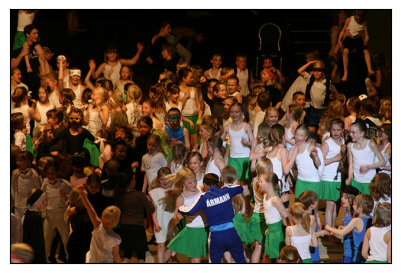

--------------------------------------------------------------------------------

Запрос: A red high speed racing boat skips across the water .
Лучшее совпадение (Score: 0.3727): 345785626_9fa59f38ce.jpg


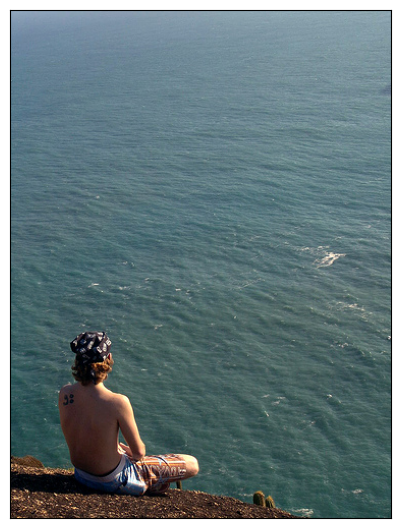

--------------------------------------------------------------------------------

Запрос: A bicyclist is jumping on ramp covered with graffiti .
Лучшее совпадение (Score: 0.4614): 3517023411_a8fbd15230.jpg


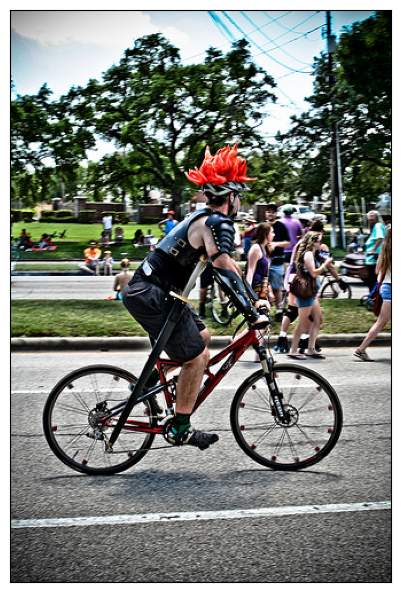

--------------------------------------------------------------------------------

Запрос: The small dog returns with his stick proudly .
Лучшее совпадение (Score: 0.1768): 2986716822_e220754d32.jpg


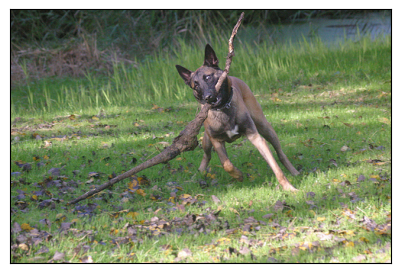

--------------------------------------------------------------------------------

Запрос: A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket .
Лучшее совпадение (Score: 0.4598): 2505465055_f1e6cf9b76.jpg


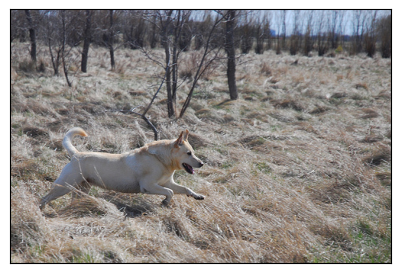

--------------------------------------------------------------------------------

Запрос: The tennis player in the blue shirt is holding his racquet up in the air .
Лучшее совпадение (Score: 0.5772): 3421547427_53411b6278.jpg


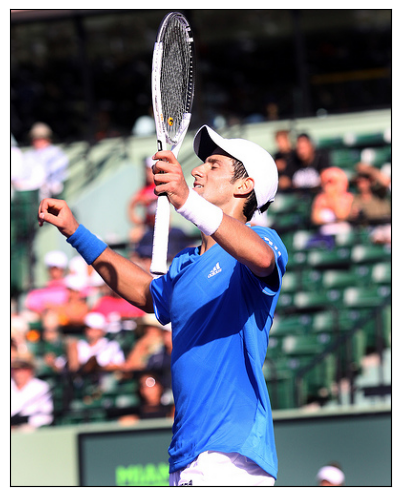

--------------------------------------------------------------------------------

Запрос: A woman in purple with two children in the mouth of a cave .
Status: BLOCKED


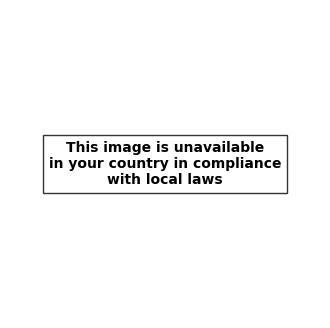

--------------------------------------------------------------------------------

Запрос: Little boy standing on the bank of a river .
Status: BLOCKED


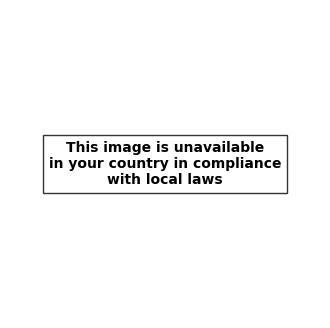

--------------------------------------------------------------------------------

Запрос: Two little girls in pink outfits play on a yellow and red playground .
Status: BLOCKED


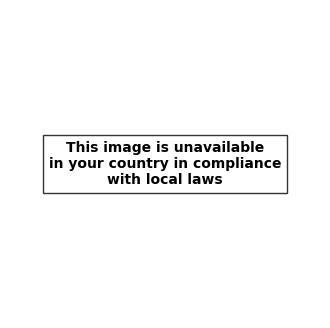

--------------------------------------------------------------------------------

Запрос: Little brown and white dog running on the sidewalk .
Лучшее совпадение (Score: 0.6798): 2986716822_e220754d32.jpg


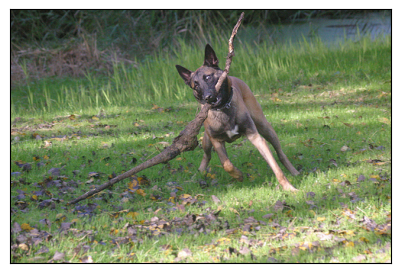

--------------------------------------------------------------------------------


In [71]:
net.load_state_dict(best_model_weights)
search_and_show(test_queries, net, test_images_norm, test_image_names_list)

Модель справляется лишь отчасти: изображения в большинстве случаев только частично совпадают с запросом.

Модели явно не хватает обучающих данных, плюс, мы использовали замороженные веса ResNet и BERT, т.е. мы пытались научить новую нейросеть связывать картинки и текст, используя статичные признаки, которые никогда не обучались друг под друга (вектор ResNet описывает ЧТО на картинке (класс: собака), но не КАКАЯ она (белая/черная, бежит/стоит), а вектор BERT описывает смысл слов).

Можно попробовать использовать предобученную модель CLIP, которая обучена сопоставлять картинки и тексты в едином векторном пространстве на большом объеме данных.

In [72]:
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model.eval()

unique_test_images = df_test['image'].unique().tolist()
clip_image_embeddings = []

batch_size = 32
for i in range(0, len(unique_test_images), batch_size):
    batch_names = unique_test_images[i:i+batch_size]
    images = [Image.open(os.path.join(TEST_IMAGES_PATH, name)) for name in batch_names]
    inputs = clip_processor(images=images, return_tensors="pt", padding=True).to(device)
    
    with torch.no_grad():
        features = clip_model.get_image_features(**inputs)
        # Нормализуем векторы сразу
        features /= features.norm(p=2, dim=-1, keepdim=True)
        clip_image_embeddings.append(features)

clip_image_embeddings = torch.cat(clip_image_embeddings)
print(f"Размерность векторов изображений тестовой выборки: {clip_image_embeddings.shape}")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Размерность векторов изображений тестовой выборки: torch.Size([100, 512])


In [73]:
def search_and_show_clip(queries, model, processor, img_features, img_names):
    '''
    Ищет изображения с помощью CLIP
    '''
    
    for query_text in queries:
        print(f"\nЗапрос: {query_text}")
        
        processed_query = preprocess_text(query_text).split()
        if any(word in ban_keywords for word in processed_query):
            print("Status: BLOCKED")
            plt.figure(figsize=(4, 4))
            plt.text(0.5, 0.5, "This image is unavailable\nin your country in compliance\nwith local laws", 
                     horizontalalignment='center', verticalalignment='center', 
                     fontsize=10, weight='bold',
                     bbox=dict(facecolor='white', alpha=0.8))
            plt.axis('off')
            plt.show()
            print("-" * 80)
            continue

        inputs_text = processor(text=[query_text], return_tensors="pt", padding=True).to(device)
        with torch.no_grad():
            text_features = model.get_text_features(**inputs_text)
            text_features /= text_features.norm(p=2, dim=-1, keepdim=True)
            
        similarity = (text_features @ img_features.T)
        
        # Min-Max Scaling (чтобы получить скор 0..1)
        min_val = similarity.min()
        max_val = similarity.max()
        # Защита от деления на ноль, если все скоры одинаковые
        if max_val - min_val > 1e-9:
            scores_normalized = (similarity - min_val) / (max_val - min_val)
        else:
            scores_normalized = similarity
        
        values, indices = scores_normalized[0].topk(1)
        
        best_idx = indices[0].item()
        best_image_name = img_names[best_idx]
        best_score = values[0].item()
        
        print(f"Лучшее совпадение (Score: {best_score:.4f}): {best_image_name}")
        
        try:
            show_images(path=TEST_IMAGES_PATH, 
                        images=[best_image_name], 
                        images_cnt=1, 
                        title=False)
        except Exception as e:
            print(f"Ошибка загрузки картинки: {e}")
        
        print("-" * 80)


Запрос: A group of people in a large yard toss a disc .
Лучшее совпадение (Score: 1.0000): 3398788809_25c71ba018.jpg


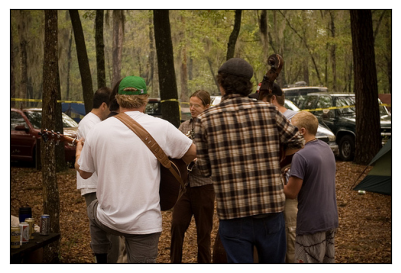

--------------------------------------------------------------------------------

Запрос: A red high speed racing boat skips across the water .
Лучшее совпадение (Score: 1.0000): 3722572342_6904d11d52.jpg


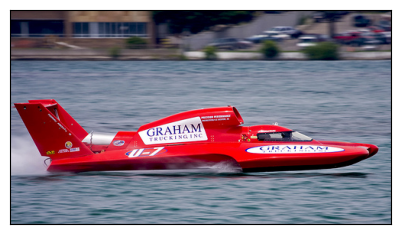

--------------------------------------------------------------------------------

Запрос: A bicyclist is jumping on ramp covered with graffiti .
Лучшее совпадение (Score: 1.0000): 2885891981_6b02620ae9.jpg


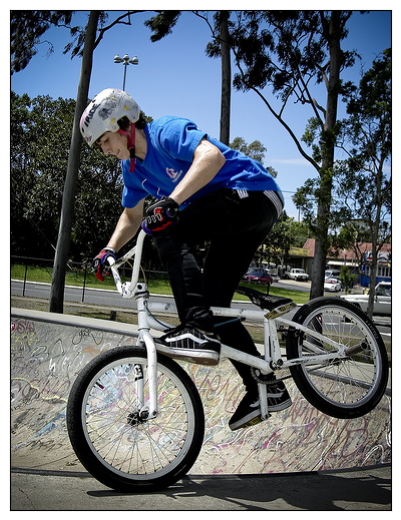

--------------------------------------------------------------------------------

Запрос: The small dog returns with his stick proudly .
Лучшее совпадение (Score: 1.0000): 2986716822_e220754d32.jpg


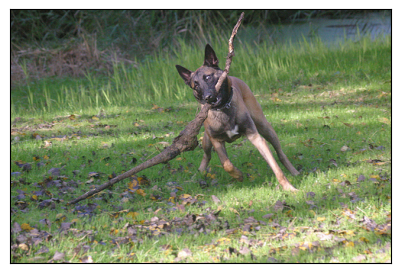

--------------------------------------------------------------------------------

Запрос: A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket .
Лучшее совпадение (Score: 1.0000): 2448210587_9fe7ea5f42.jpg


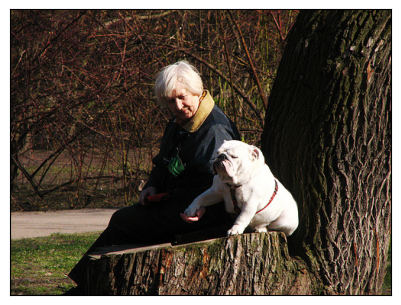

--------------------------------------------------------------------------------

Запрос: The tennis player in the blue shirt is holding his racquet up in the air .
Лучшее совпадение (Score: 1.0000): 3421547427_53411b6278.jpg


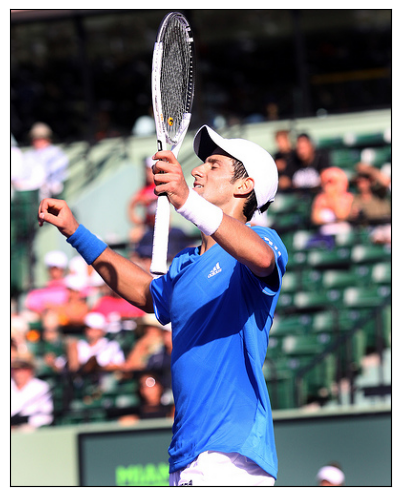

--------------------------------------------------------------------------------

Запрос: A woman in purple with two children in the mouth of a cave .
Status: BLOCKED


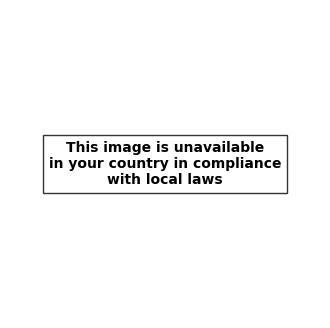

--------------------------------------------------------------------------------

Запрос: Little boy standing on the bank of a river .
Status: BLOCKED


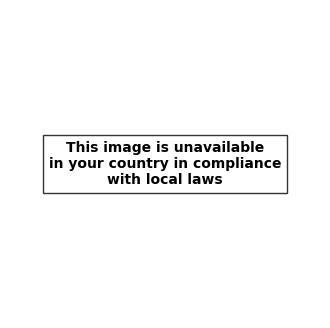

--------------------------------------------------------------------------------

Запрос: Two little girls in pink outfits play on a yellow and red playground .
Status: BLOCKED


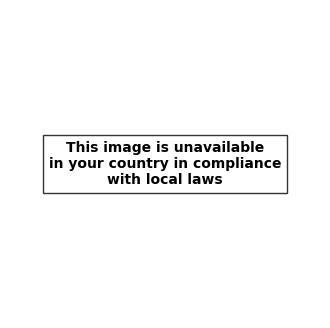

--------------------------------------------------------------------------------

Запрос: Little brown and white dog running on the sidewalk .
Лучшее совпадение (Score: 1.0000): 3488087117_2719647989.jpg


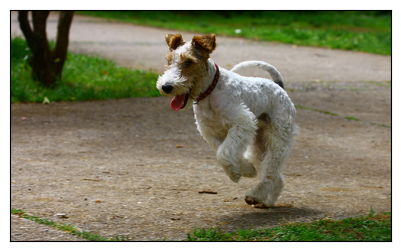

--------------------------------------------------------------------------------


In [74]:
search_and_show_clip(test_queries, clip_model, clip_processor, clip_image_embeddings, unique_test_images)

Результат, конечно, получился совершенно другой: модель очень хорошо улавливает сходство описаний и изображений.

### Вывод:

Мы провели тестирование нашей лучшей модели (полносвязная нейросеть), которая справилась лишь отчасти: изображения в большинстве случаев только частично совпадают с запросом. Модель часто путает семантически близкие сцены (например, 'собака бежит' и 'собака сидит').

В качестве эксперимента была протестирована предобученная модель CLIP, которая изначально обучена сопоставлять картинки и тексты в едином векторном пространстве. ЕЕ результаты очень сильно отличаются от нашей лучшей модели: CLIP в большинстве случаев очень хорошо находит изображения по запросу.

## 9. Выводы

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска

В ходе выполнения проекта была разработана и протестирована система поиска изображений по текстовому описанию.

Были <u>***изучены данные***</u>:
* Обучающий датасет содержит 5822 строки и 3 столбца, 1000 уникальных наименований изображений и 977 уникальных текстовых описаний.
* Папка с изображениями для обучения содержит 1000 фотографий.
* Тестовый датасет содержит 500 строк и 3 столбца, 100 уникальных наименований изображений и 500 уникальных текстовых описаний.
* Папка с тестовыми изображениями содержит 100 фотографий.
* Датасет с краудсорсинговыми оценками содержит 47830 строк и 5 столбцов с оценками для каждой пары "изображение-описание".
* Датасет с экспертными оценками содержит 5822 строки и 5 столбцов с оценками трех экспертов для каждой пары "изображение-описание" (по шкале от 1 до 4).
* Пропусков и явных дубликатов не выявлено.


В ходе <u>***исследовательского анализа данных***</u> мы изучили два датасета с экспертными и краудсорсинговыми оценками соответствия текстового описания и изображения.

* **Анализ экспертных оценок**:
    * Исходные данные были распределены по шкале от 1 до 4.
    * В качестве агрегированной оценки мы выбрали оценки второго эксперта expert_2, потому что они максимально близки к оценкам, полученным голосованием большинства, но при этом не теряется часть данных, где мнения экспертов разошлись.
    * Итоговая оценка expert_score переведена в диапазон [0, 1].
* **Анализ краудсорсинговых оценок**:
    * Больше всего значений 0 и 1, где люди могут однозначно сказать, соответствует ли описание изображению, но также есть около 4,5 тысяч спорных случаев (примерно 9.5%).
    * Данные несбалансированы (имеется сильный перекос в сторону значения 0 (не соответствие описания изображению)).
    * В большинстве случаев оценки выставлялись 3мя людьми, но также есть около 1000 записей, где соответствие оценивалось количеством людей от 4 до 6.
    * Несмотря на гораздо большее количество данных в датасете с краудсорсинговыми оценками (47830 записей), пересечений с `df_train` всего 40%. 

Для обучения моделей **будут использованы только экспертные оценки**:
* экспертные оценки получены квалифицированными специалистами и скорее всего являются максимально чистыми и достоверными;
* они более информативны, так как покрывают случаи, когда описание не полностью соответствует изображению;
* они полностью соответствуют обучающему датасету `df_train`.


Мы произвели <u>***проверку данных***</u> на содержание изображений с детьми до 16 лет и, отфильтровав текстовые описания с помощью списка "запрещенных" слов, удалили из обучающего датасета все изображения, подходящие по этот фильтр.

В результате обработки мы получили итоговый датасет из 3810 строк, 665 уникальных изображений и 928 уникальных текстовых описаний.


Мы <u>***векторизовали изображения***</u> с помощью предобученную нейросеть ResNet-18 (размерность каждого вектора составила 512).

И <u>***векторизовали текстовые описания***</u> с помощью предобученной модели BERT (`sentence-transformers/all-MiniLM-L6-v2`) (размерность каждого вектора составила 384).


Нормализовав векторы изображений и текстов по отдельности, мы <u>***объединили векторы***</u> и получили размерность 896.


<u>***Обучение моделей***</u>.

Для оценки качества модели использовалась метрика RMSE, а чтобы понять насколько хорошо справляются модели, мы использовали бейзлайн (DummyRegressor), который показал RMSE=0.3090.

И были обучены линейная модель без регуляризации и с регуляризацией и полносвязная нейронная сеть:
* Линейные модели (LinearRegression, ElasticNet) показали слабый прирост качества относительно бейзлайна. Это может говорить о том, что зависимость между эмбеддингами изображений (ResNet) и текстов (BERT) имеет сложную нелинейную природу, которую линейные алгоритмы не способны уловить.
* Лучший результат показала нейронная сеть (5 слоев, с функцией активации ReLU и оптимизатором Adam, с применением Dropout=0.5 на каждом слое и Weight Decay (0.005)) (RMSE=0.2425). 


Мы провели <u>***тестирование нашей лучшей модели***</u> (полносвязная нейросеть), которая справилась лишь отчасти: изображения в большинстве случаев только частично совпадают с запросом. Модель часто путает семантически близкие сцены (например, 'собака бежит' и 'собака сидит').

В качестве эксперимента была протестирована предобученная модель CLIP, которая изначально обучена сопоставлять картинки и тексты в едином векторном пространстве. ЕЕ результаты очень сильно отличаются от нашей лучшей модели: CLIP в большинстве случаев очень хорошо находит изображения по запросу.